## Лабораторная работа №7

Задание: Найти шаблон

In [11]:
import sys
sys.path.append('../')
import cv2  
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift, estimate_bandwidth

# Изменим стандартный размер графиков matplotlib
WIDTH_SIZE = 15
HEIGHT_SIZE = 10
plt.rcParams["figure.figsize"] = [WIDTH_SIZE, HEIGHT_SIZE]

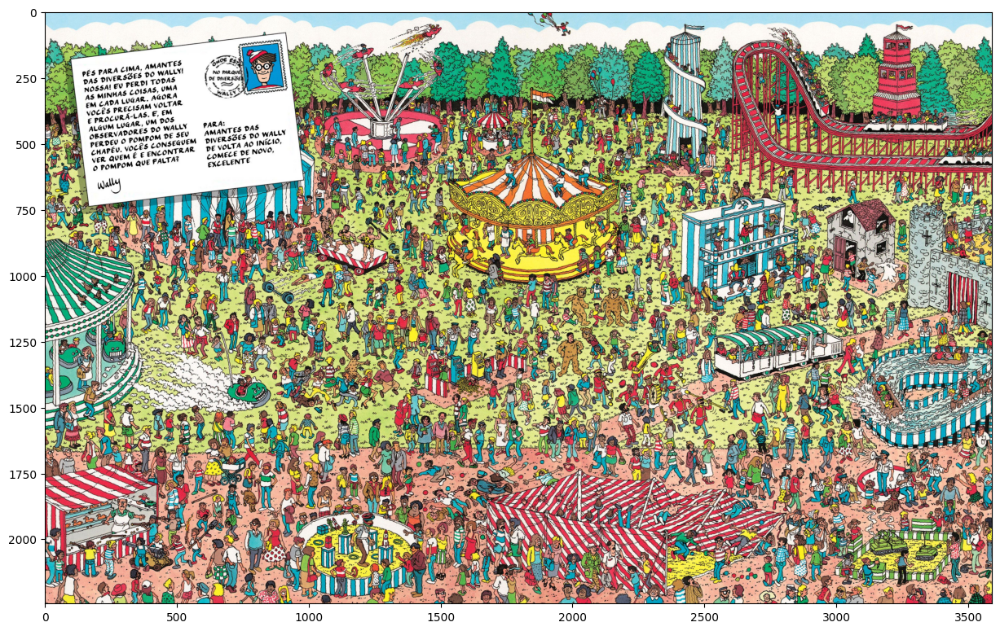

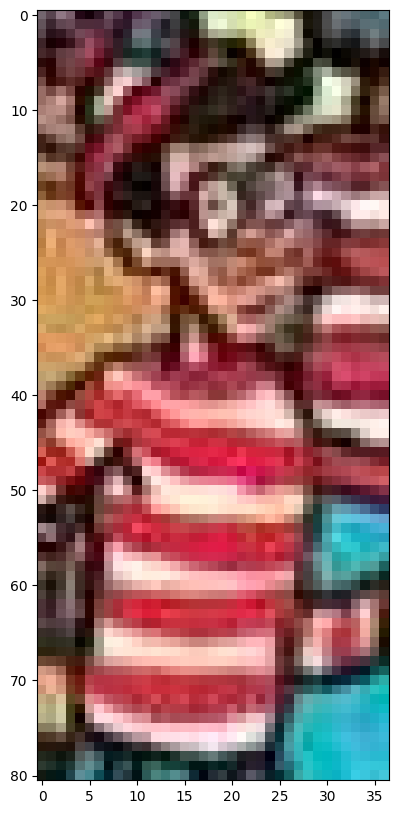

In [12]:
# Загружаем изображение
rgb_img = cv2.imread('image.jpg') 
plt.figure()
plt.imshow(cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB))
# Преобразуем изображение в оттенки серого 
gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2GRAY)

# Загружаем шаблон  
template = cv2.imread('find_image.jpg')[:,::-1]
plt.figure()
plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))

# Преобразуем в оттенки серого
gray_templ = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)  

(2.3779728412628174, 949.5661010742188)
1.8821114301681519
143.16647338867188
0.050565239042043686
1.8821114301681519


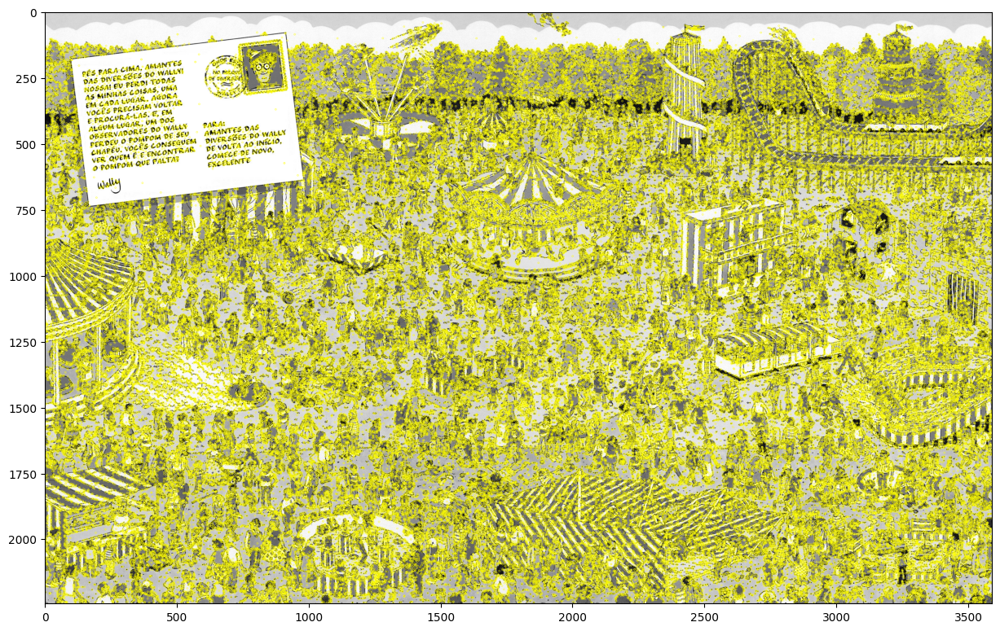

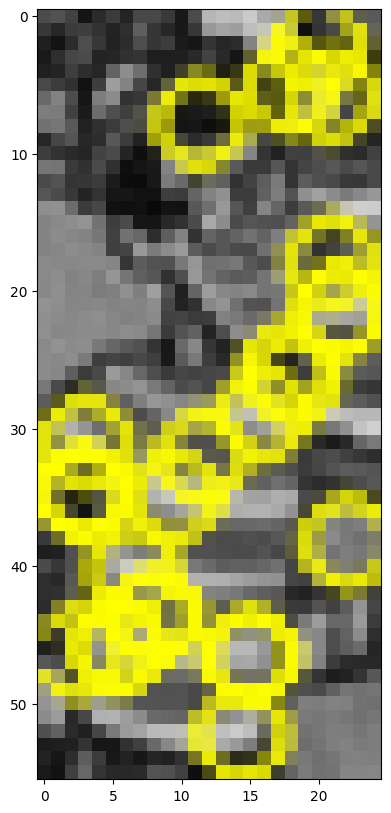

In [13]:
# Преобразуем и вносим небольшие изменения в шаблон

    # Преобразуем в оттенки серого
scale = 0.7 # масштаб изменения размеров
scBr = 0.85 # коэффициент изменения яркости

template_scale = cv2.resize(np.uint8(scBr*cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)),
           (int(template.shape[1]*scale), int(template.shape[0]*scale)), interpolation = cv2.INTER_AREA)

# Создаем детектор особых точек
sift = cv2.SIFT_create()
# sift = cv2.xfeatures2d.SIFT_create() # В зависимости от версии opencv может работать эта команда

# Запускаем детектор на изображении и на шаблоне
# Метод возвращает список особых точек и их дескрипторов
k_1, des_1 = sift.detectAndCompute(gray_img, None)
k_2, des_2 = sift.detectAndCompute(template_scale, None)

# Каждая особая точка имеет несколько параметров, таких как координаты, 
# размер, угол ориентации, мощность отклика и размер области особой точки.
print(k_1[1].pt)
print(k_1[1].size)
print(k_1[1].angle)
print(k_1[1].response)
print(k_1[1].size)

# Отрисуем найденные точки на картинке
image_key_point = cv2.drawKeypoints(gray_img, k_1, des_1, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(image_key_point, cv2.COLOR_BGR2RGB))

# Отрисуем найденные точки на шаблоне
template_key_point = cv2.drawKeypoints(template_scale, k_2, des_2, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(template_key_point, cv2.COLOR_BGR2RGB))

In [14]:
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(des_1, des_2)

print(len(matches))


24


9.396296501159668


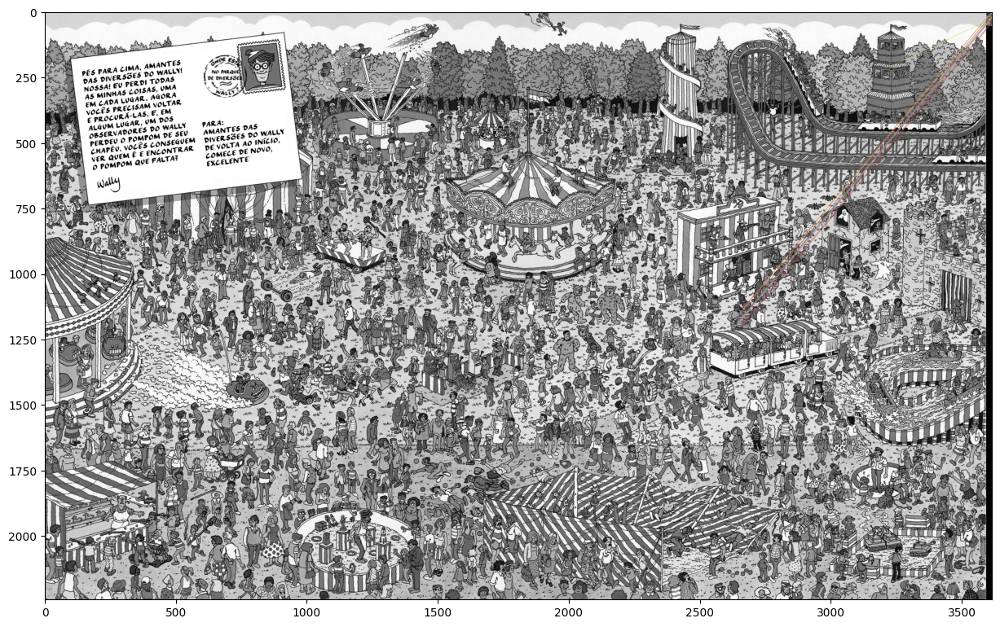

In [15]:
print(k_1[matches[1].queryIdx].size)
matches = sorted(matches, key=lambda x: x.distance)
image_with_matches = cv2.drawMatches(gray_img, k_1, template_scale, k_2, matches[:20], template_scale, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_matches, cv2.COLOR_BGR2RGB))

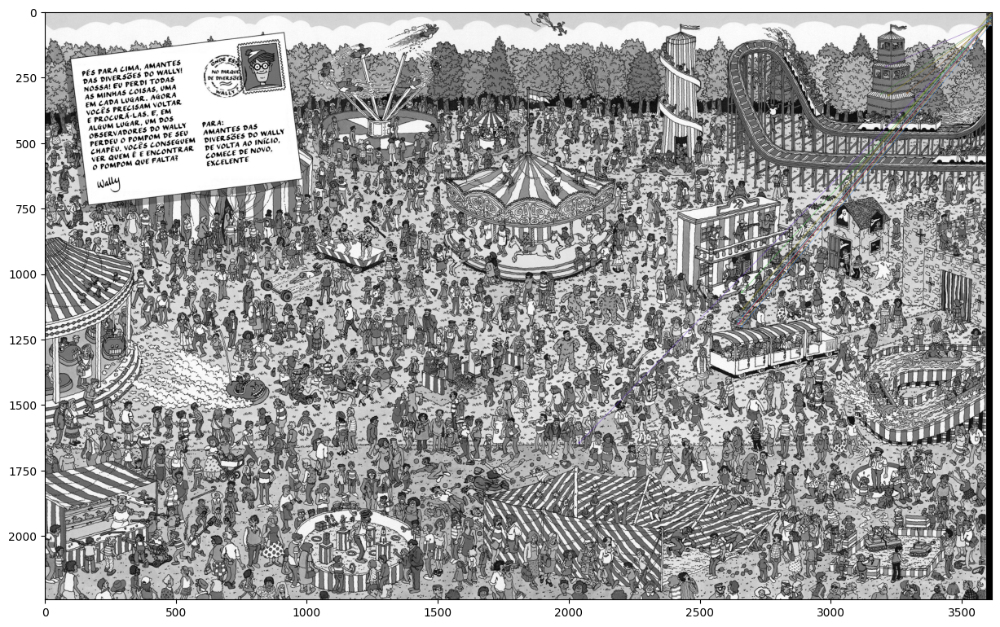

In [16]:
bf = cv2.BFMatcher(cv2.NORM_L1)
matches = bf.knnMatch(des_1, des_2, k=2)

# Лучшие пары особых точек отбираются с использованием теста отношения правдоподобия
good = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good.append([m])

# построим совпадения на изображении
image_with_knn_matches = cv2.drawMatchesKnn(gray_img,k_1,template_scale,k_2,good[:200],None,flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_knn_matches, cv2.COLOR_BGR2RGB))


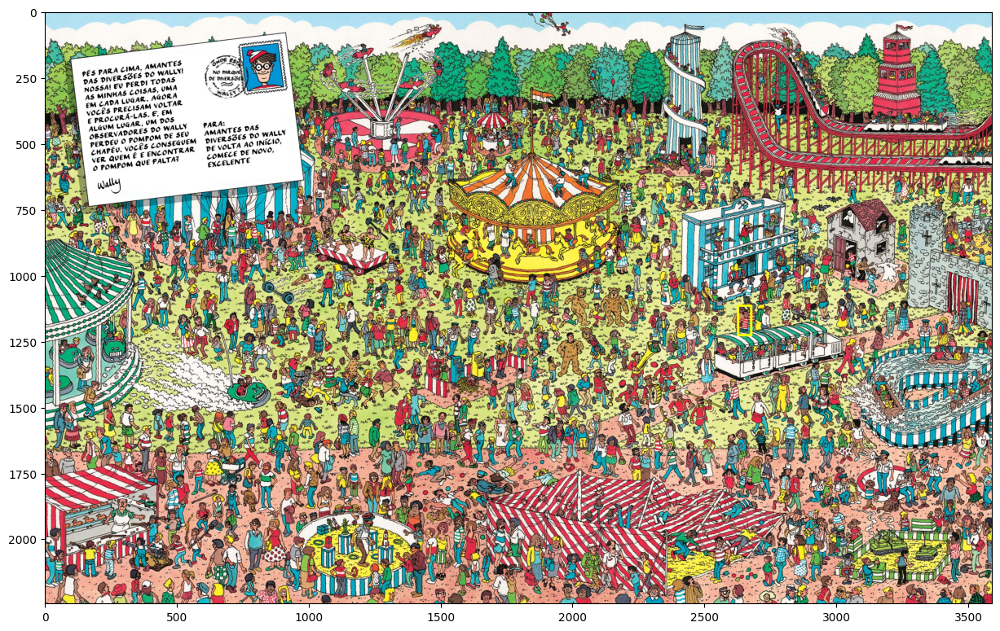

In [17]:
points = np.array([(0, 0)])
for i in good:
    points = np.append(points, [k_1[i[0].queryIdx].pt], axis=0)

points = points[1:len(points)]

# Определяем ширину окна и запускаем алгоритм кластеризации
bandwidth = estimate_bandwidth(points, quantile=0.4)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=False, cluster_all=False)
cl = ms.fit_predict(points)

# Формируем кластеры особых точек
labels_unique = np.unique(ms.labels_)
kp = []
for i in labels_unique:
    kp.append(points[cl==i])

# Определяем центры кластеров, но только если в кластере содержится более 10 точек
cen = []
for i in kp:
    if len(i) > 10:
        cen.append(np.mean(i, axis=0).astype(np.uint16))

# Вокруг выделенных центров обводим прямоугольники с размерами шаблона
plot_img = rgb_img.copy()
h, w = template_scale.shape

for pt in cen:
    cv2.rectangle(plot_img, (pt[0] - w, pt[1] - h),(pt[0] + w, pt[1] + h),(0,255,255), 8)  

# Отображаем результат на графике
plt.figure()
plt.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))